# Image Recognition - Breast Cancer Classification
## Based on Ultrasound Imaging for Benign, Normal and Malignant Tumors
### We used the following Libaries from Tensorflow.keras including EfficientNetB0 which we used as a reference for our actual model

In [13]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import random
import pandas as pd
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import precision_recall_curve, average_precision_score
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Suppress TensorFlow warnings



### We provided three files each containing images from the Kaggle's Breast Cancer Ultrasound Images Dataset
https://www.kaggle.com/datasets/aryashah2k/breast-ultrasound-images-dataset

In [14]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

# Path to dataset
dataset_path = 'Dataset_BUSI_with_GT'

# Subdirectories
subdirs = ['benign', 'normal', 'malignant']

#Image Parameters
img_height = 224
img_width = 224
#Class Names
class_names = ['benign', 'normal', 'malignant']

# Parameters
batch_size = 32
learning_rate = 0.0005
learning_rate_min = 0.00001
epochs = 25
epoch_lt_value = 10
patience_value = 20
patience_value_lr = 10
Dropout_Value1 = 0.50
Dropout_Value2 = 0.50
filter1 = 32
filter2 = 64
filter3 = 128
filter4 = 256
filter5 = 512


- To ensure we had the right count of images, we did a loop through each subdirectory and counted the images without '_mask' in their title. 
- All the images were PNG files.

    -- Benign - Smooth surface

    -- Malignant - Rough Surface
    
    -- Normal - Black with no contrast.

In [15]:
# Count images
image_counts = {}
for subdir in subdirs:
    subdir_path = os.path.join(dataset_path, subdir)
    images = [f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f)) and '_mask' not in f]
    count = len(images)
    image_counts[subdir] = count

for category, count in image_counts.items():
    print(f"{category.capitalize()}: {count} Ultra Sound Images")

Benign: 437 Ultra Sound Images
Normal: 133 Ultra Sound Images
Malignant: 210 Ultra Sound Images


### Create Custom Data Generator
- Using tensorflow.keras.utils.Sequence, this class is designed to generate batches of data for training and validation, specifically focusing on images that have do not '_mask' in their filenames (Ultrasound Images).
    - Steps in Class CustomImageDataGenerator
        - 1. __init__ initalizes the data generator with the necessary parameters and prepares the filenames and labels. 
            - Calls the __get_filenames_and_labels__
            - Calls __on_epoch_end__
        - 2. We use _get_filenames_and_labels__ method to gather the filenames suffixed without '_mask'and assign them labels based on their directory.
        - 3. __len__ method returns the number of batches per epoch
        - 4. The __get_item__ method generates one batch of data
        - 5. The __on_epoch_end__ method shuffles the order of the filenames and labels at the end of each epoch to ensure the model does not learn the order of the data
        - 6. Then we put it all together specifying paths and parameters, identifying class names and creating the training and validation generators.
        - 7. __debug_print__  This was put in to make sure that the Data Generator was working properly by looping through the __get_Item__ method

In [16]:
class CustomImageDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, directory, batch_size, img_height, img_width, subset, class_names, seed):
        self.directory = directory
        self.batch_size = batch_size
        self.img_height = img_height
        self.img_width = img_width
        self.subset = subset
        self.seed = seed
        self.class_names = class_names
        self.filenames, self.labels = self._get_filenames_and_labels()
        self.on_epoch_end()

    def _get_filenames_and_labels(self):
        filenames = []
        labels = []
        for label, subdir in enumerate(self.class_names):
            subdir_path = os.path.join(self.directory, subdir)
            images = [f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f)) and '_mask' not in f]
            if self.subset == 'training':
                images = images[:int(0.6 * len(images))]
            elif self.subset == 'validation':
                images = images[int(0.6 * len(images)):int(0.85 * len(images))]
            elif self.subset == 'test':
                images = images[int(0.85 * len(images)):]
            for img in images:
                filenames.append(os.path.join(subdir, img))
                labels.append(label)
        print(f"Subset: {self.subset}, Number of images: {len(filenames)}")  # Debug print
        return filenames, labels
    
    def __len__(self):
        return len(self.filenames) // self.batch_size

    def __getitem__(self, index):
        batch_filenames = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]
        images = []
        labels = []
        for filename, label in zip(batch_filenames, self.labels[index * self.batch_size:(index + 1) * self.batch_size]):
            img_path = os.path.join(self.directory, filename)
            image = load_img(img_path, target_size=(self.img_height, self.img_width))
            image = img_to_array(image) / 255.0  # Normalize the image
            images.append(image)
            labels.append(label)
        return np.array(images), tf.keras.utils.to_categorical(labels, num_classes=len(self.class_names))

    def on_epoch_end(self):
        combined = list(zip(self.filenames, self.labels))
        np.random.shuffle(combined)
        self.filenames, self.labels = zip(*combined)
    def debug_print(self):
        print(f"{self.subset} data - number of batches: {len(self)}")
        for i in range(len(self)):
            images, labels = self[i]
            print(f"Batch {i} - images shape: {images.shape}, labels shape: {labels.shape}")
            if i >= 2:  # Printed only the first 2 batches to avoid too much output
                break


### Create the Custom Callback to display images
- Using tf.keras.callbacks.Callback: this class is designed to display images from the validation dataset along with their true and predicted labels at the end of each epoch.
    - 1. __init__ initializes callback with the validation data and the number of images to display.
    - 2. __on_epoch_end__ method called at the end of the epoch retrieves a batch of images from the validation data, makes predictions using the model (either EfficientNetB0 or Basic Model we built) and displays the images with their true and predicted labels.
- To summarize this step:
    - Gets a batch of images and labels
    - Makes Predictions
    - Defines the class Names
    - Creates a figure
    - Loops over the number of images to Display
    - Shows the figure
- This step is necessary to callback the images and ensure the model is performing as expected.

In [17]:
class ImageDisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data, num_images=5, output_dir='output_images'):
        self.validation_data = validation_data
        self.num_images = num_images
        os.makedirs(output_dir, exist_ok=True)

    def on_epoch_end(self, epoch, logs=None):
        images, labels = next(iter(self.validation_data))
        predictions = self.model.predict(images)
        class_names = ['benign', 'normal', 'malignant']
        plt.figure(figsize=(15, 15))
        for i in range(self.num_images):
            ax = plt.subplot(1, self.num_images, i + 1)
            plt.imshow(images[i])
            true_label = np.argmax(labels[i])
            pred_label = np.argmax(predictions[i])
            plt.title(f"True: {class_names[true_label]}, Pred: {class_names[pred_label]}")
            plt.axis("off")
        plt.show()




## Learning Rate Scheduler
- This was used to adjust the learning rate during training. 
- The scheduler takes the epoch and learning rate as inputs and returns a modified learning rate based on each epoch

In [18]:
# Learning Rate Scheduler
def scheduler(epoch, lr):
    if epoch < epoch_lt_value:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

reduce_lr = LearningRateScheduler(scheduler)

## Creating Data Generators
- Creates instances of CustomImageDataGenerator for training, validation and test datasets

In [19]:
# Create training and validation generators
train_gen = CustomImageDataGenerator(dataset_path, batch_size, img_height, img_width, subset='training', class_names=class_names, seed=seed)
val_gen = CustomImageDataGenerator(dataset_path, batch_size, img_height, img_width, subset='validation', class_names=class_names, seed=seed)
test_gen = CustomImageDataGenerator(dataset_path, batch_size, img_height, img_width, subset='test', class_names=class_names, seed=seed)

Subset: training, Number of images: 467
Subset: validation, Number of images: 195
Subset: test, Number of images: 118


## Checking for Data Balance
- After an initial run through of our model, we noticed some issues with discrepancy between the classes in the training data. In order to clearly dissect the problem we checked for imbalance.
- As noted in our paper, viewing the confusion matrix for our first run indicated that our model was only predicting for the benign class. While this initially gave us a high accuracy score on our test set, this accuracy score cannot be considered valid as the model was not learning and predicting properly for all classes.

In [20]:
# Debug print to verify data loading
train_gen.debug_print()
val_gen.debug_print()
test_gen.debug_print()

training data - number of batches: 14
Batch 0 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 1 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 2 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
validation data - number of batches: 6
Batch 0 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 1 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 2 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
test data - number of batches: 3
Batch 0 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 1 - images shape: (32, 224, 224, 3), labels shape: (32, 3)
Batch 2 - images shape: (32, 224, 224, 3), labels shape: (32, 3)


# Calculate Class Weights
- As we continued to dig into our class imbalance, we computed class weights to help with the issue.
- Prior to fixing this imbalance, all of predicted values were 'benign' creating no more than a guessing game for predictibility.

In [21]:
train_counts = {class_name: 0 for class_name in class_names}
for label in train_gen.labels:
    train_counts[class_names[label]] += 1

print("Training data class distribution:")
for class_name, count in train_counts.items():
    print(f"{class_name}: {count}")

true_labels = train_gen.labels
# Calculate class weights
class_weights = compute_class_weight('balanced', classes=np.unique(true_labels), y=true_labels)
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

print("Class weights:", class_weights_dict)

Training data class distribution:
benign: 262
normal: 79
malignant: 126
Class weights: {0: 0.594147582697201, 1: 1.970464135021097, 2: 1.2354497354497354}


# REFERENCE MODEL USING EFFICIENTNETB0
EfficientNetB0 is a highly efficient and accurate CNN architecture designed using the principles of compound scaling and optimized layers like MBConv and SE blocks. It balances depth, width, and resolution in a systematic way to achieve superior performance with fewer parameters and computational resources. EfficientNetB0 serves as the baseline model, and its variants (B1 to B7) scale up the architecture to achieve even higher accuracy.

CREATING AND COMPILING MODEL:

In [22]:

base_model = EfficientNetB0(weights='imagenet', include_top=False, input_tensor=Input(shape=(img_height, img_width, 3)))
for layer in base_model.layers:
    layer.trainable = False  # Freeze the base model layers initially

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.5)(x)
predictions = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers[-20:]:  # Unfreeze the last 20 layers
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
#Transfer Learning - takes the training from this model and uses in our custom model


### Generating Callbacks
These callbacks enhance the training process by:

- __EarlyStopping:__ Preventing overfitting by stopping training when no improvement is seen in validation loss.
- __ModelCheckpoint:__ Saving the best model during training based on validation loss.
- __ReduceLROnPlateau:__ Adjusting the learning rate dynamically to ensure better convergence.
- __ImageDisplayCallback:__ Providing visual feedback on the model’s predictions, which helps in understanding how the model is learning.

In [23]:
# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=patience_value, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')
reduce_lr_on_plateau = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=patience_value_lr, min_lr=learning_rate_min)
display_callback = ImageDisplayCallback(validation_data=val_gen, num_images=5)

Epoch 1/25


14/14 [==============================] - ETA: 0s - loss: 1.8744 - accuracy: 0.3326

C:\Users\margb\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 3s 3s/step


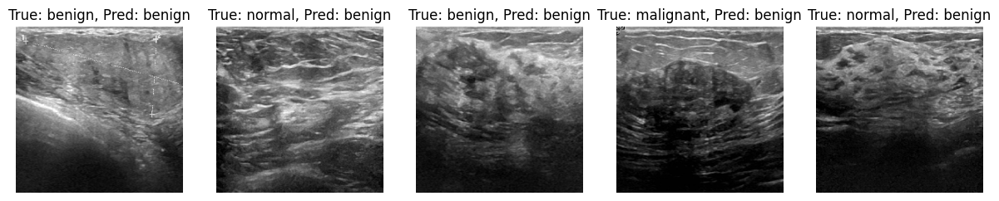

14/14 [==============================] - 29s 1s/step - loss: 1.8744 - accuracy: 0.3326 - val_loss: 1.7500 - val_accuracy: 0.5573 - lr: 1.0000e-05
Epoch 2/25
1/1 [==============================] - 0s 334ms/steposs: 1.8649 - accuracy: 0.35


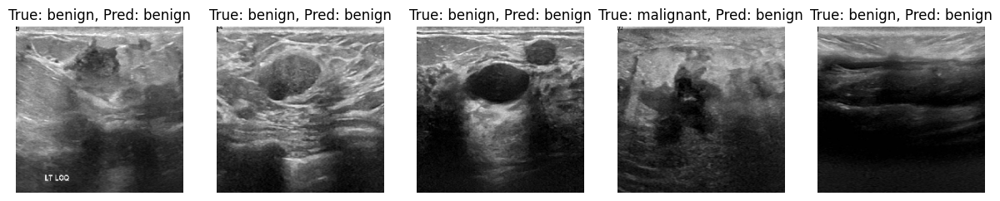

14/14 [==============================] - 11s 763ms/step - loss: 1.8649 - accuracy: 0.3549 - val_loss: 1.7504 - val_accuracy: 0.5625 - lr: 1.0000e-05
Epoch 3/25
1/1 [==============================] - 0s 269ms/steposs: 1.8311 - accuracy: 0.37


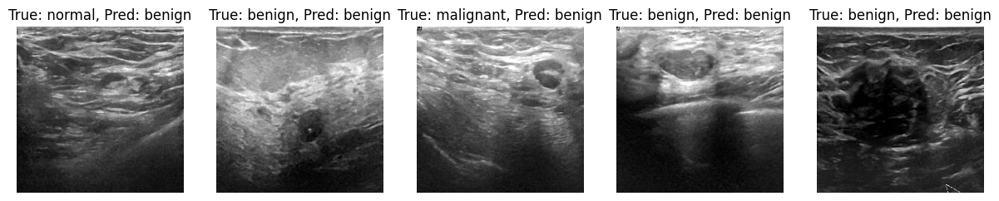

14/14 [==============================] - 10s 689ms/step - loss: 1.8311 - accuracy: 0.3705 - val_loss: 1.7517 - val_accuracy: 0.5573 - lr: 1.0000e-05
Epoch 4/25
1/1 [==============================] - 0s 261ms/steposs: 1.8448 - accuracy: 0.35


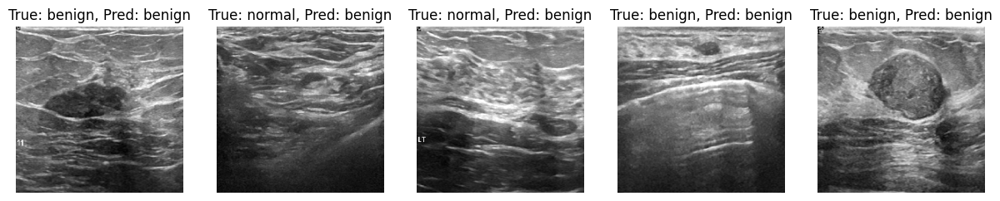

14/14 [==============================] - 10s 697ms/step - loss: 1.8448 - accuracy: 0.3504 - val_loss: 1.7506 - val_accuracy: 0.5625 - lr: 1.0000e-05
Epoch 5/25
1/1 [==============================] - 0s 287ms/steposs: 1.8417 - accuracy: 0.34


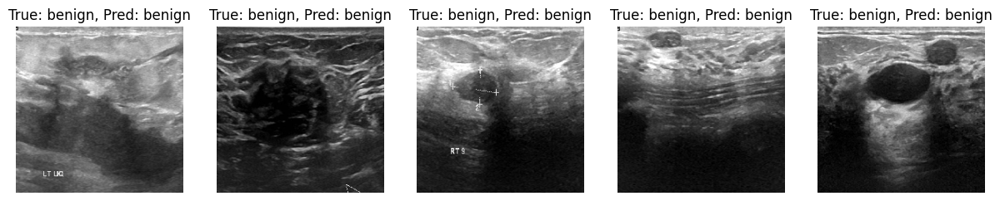

14/14 [==============================] - 10s 709ms/step - loss: 1.8417 - accuracy: 0.3415 - val_loss: 1.7565 - val_accuracy: 0.5521 - lr: 1.0000e-05
Epoch 6/25
1/1 [==============================] - 0s 267ms/steposs: 1.8121 - accuracy: 0.39


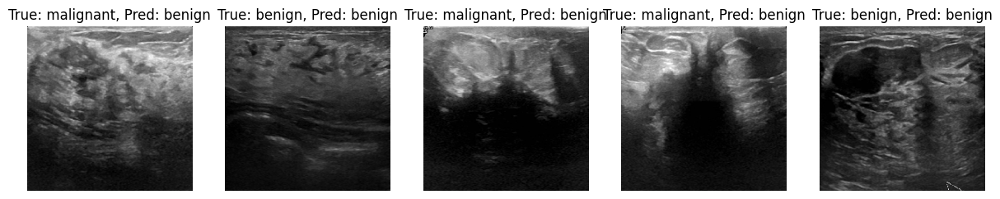

14/14 [==============================] - 10s 729ms/step - loss: 1.8121 - accuracy: 0.3906 - val_loss: 1.7553 - val_accuracy: 0.5625 - lr: 1.0000e-05
Epoch 7/25
1/1 [==============================] - 0s 275ms/steposs: 1.8385 - accuracy: 0.32


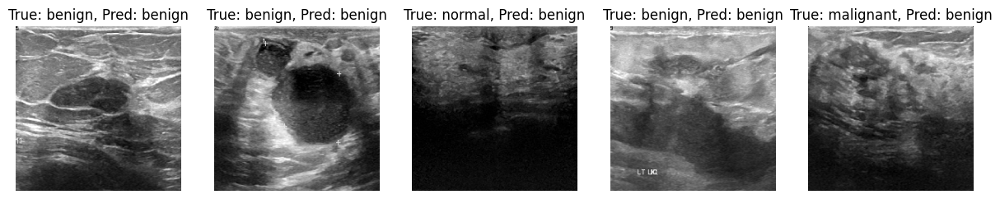

14/14 [==============================] - 10s 692ms/step - loss: 1.8385 - accuracy: 0.3281 - val_loss: 1.7574 - val_accuracy: 0.5573 - lr: 1.0000e-05
Epoch 8/25
1/1 [==============================] - 0s 264ms/steposs: 1.8441 - accuracy: 0.31


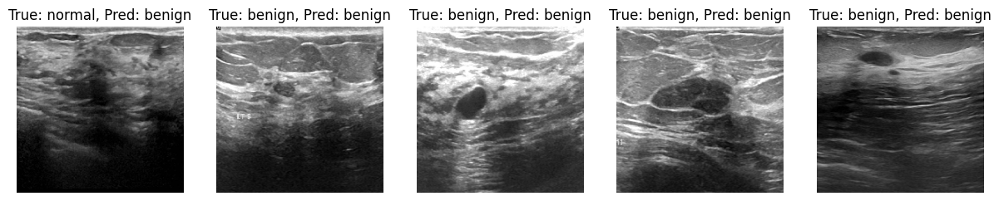

14/14 [==============================] - 9s 671ms/step - loss: 1.8441 - accuracy: 0.3192 - val_loss: 1.7596 - val_accuracy: 0.5573 - lr: 1.0000e-05
Epoch 9/25
1/1 [==============================] - 0s 263ms/steposs: 1.8262 - accuracy: 0.33


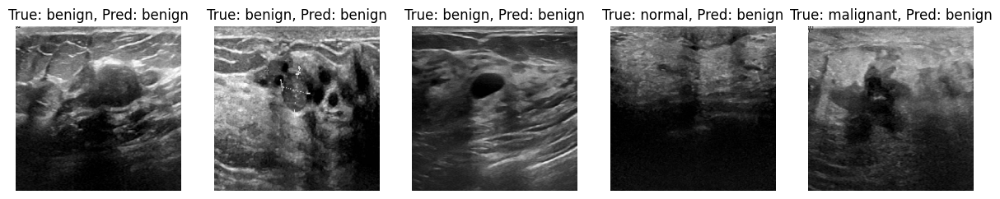

14/14 [==============================] - 9s 659ms/step - loss: 1.8262 - accuracy: 0.3371 - val_loss: 1.7573 - val_accuracy: 0.5677 - lr: 1.0000e-05
Epoch 10/25
1/1 [==============================] - 0s 262ms/steposs: 1.8510 - accuracy: 0.33


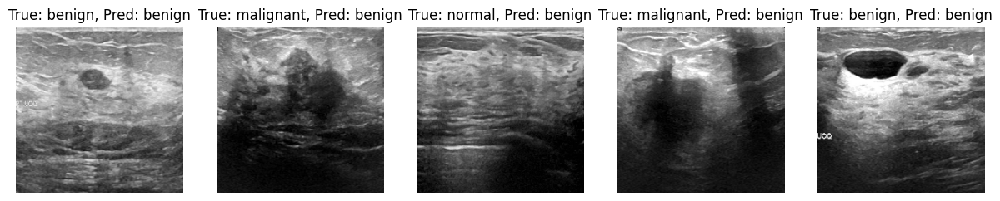

14/14 [==============================] - 9s 662ms/step - loss: 1.8510 - accuracy: 0.3348 - val_loss: 1.7600 - val_accuracy: 0.5625 - lr: 1.0000e-05
Epoch 11/25
1/1 [==============================] - 0s 309ms/steposs: 1.8332 - accuracy: 0.34


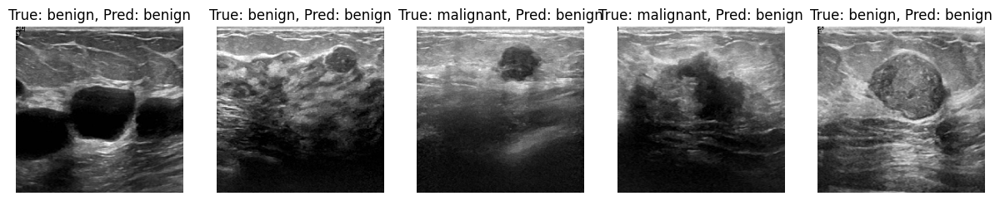

14/14 [==============================] - 10s 692ms/step - loss: 1.8332 - accuracy: 0.3438 - val_loss: 1.7593 - val_accuracy: 0.5677 - lr: 9.0484e-06
Epoch 12/25
1/1 [==============================] - 0s 262ms/steposs: 1.8425 - accuracy: 0.32


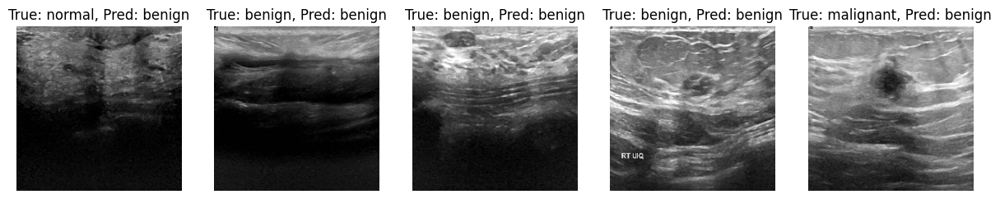

14/14 [==============================] - 9s 678ms/step - loss: 1.8425 - accuracy: 0.3259 - val_loss: 1.7643 - val_accuracy: 0.5521 - lr: 8.1873e-06
Epoch 13/25
1/1 [==============================] - 0s 355ms/steposs: 1.8274 - accuracy: 0.33


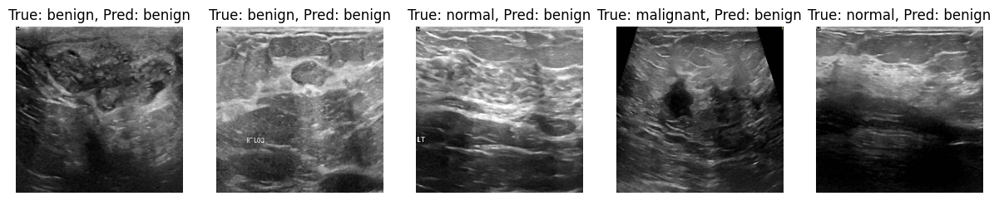

14/14 [==============================] - 11s 813ms/step - loss: 1.8274 - accuracy: 0.3304 - val_loss: 1.7630 - val_accuracy: 0.5625 - lr: 7.4082e-06
Epoch 14/25
1/1 [==============================] - 0s 292ms/steposs: 1.8268 - accuracy: 0.35


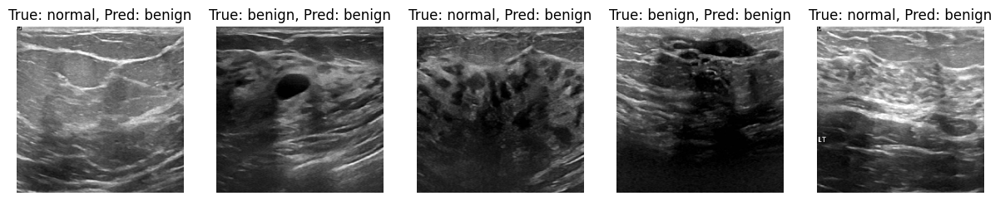

14/14 [==============================] - 11s 779ms/step - loss: 1.8268 - accuracy: 0.3504 - val_loss: 1.7660 - val_accuracy: 0.5521 - lr: 6.7032e-06
Epoch 15/25
1/1 [==============================] - 0s 385ms/steposs: 1.8341 - accuracy: 0.35


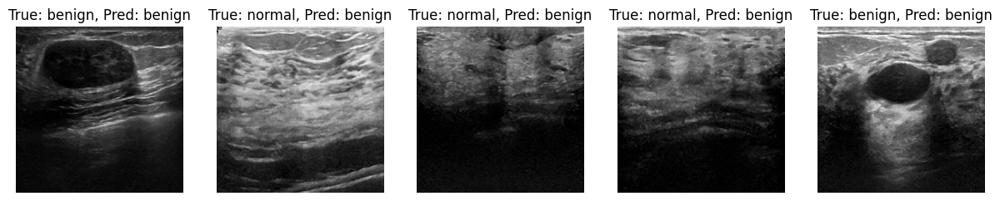

14/14 [==============================] - 12s 891ms/step - loss: 1.8341 - accuracy: 0.3549 - val_loss: 1.7639 - val_accuracy: 0.5625 - lr: 6.0653e-06
Epoch 16/25
1/1 [==============================] - 0s 357ms/steposs: 1.8415 - accuracy: 0.33


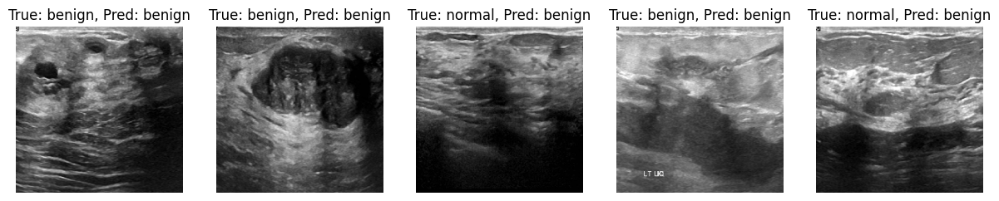

14/14 [==============================] - 12s 847ms/step - loss: 1.8415 - accuracy: 0.3371 - val_loss: 1.7662 - val_accuracy: 0.5521 - lr: 5.4881e-06
Epoch 17/25
1/1 [==============================] - 0s 317ms/steposs: 1.8228 - accuracy: 0.36


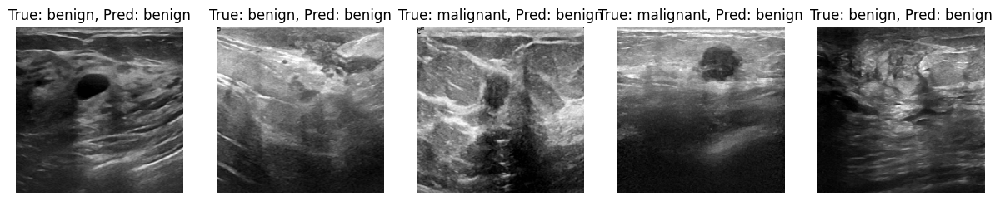

14/14 [==============================] - 12s 853ms/step - loss: 1.8228 - accuracy: 0.3661 - val_loss: 1.7646 - val_accuracy: 0.5625 - lr: 4.9659e-06
Epoch 18/25
1/1 [==============================] - 0s 366ms/steposs: 1.8333 - accuracy: 0.34


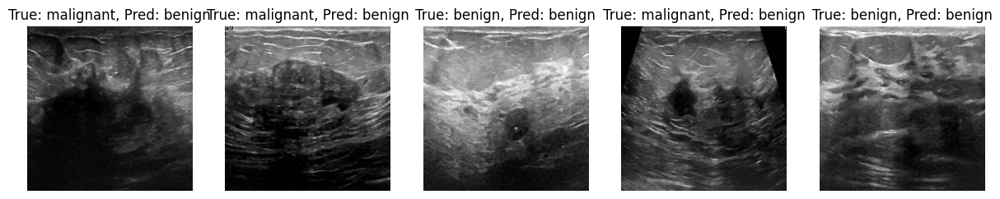

14/14 [==============================] - 12s 854ms/step - loss: 1.8333 - accuracy: 0.3415 - val_loss: 1.7684 - val_accuracy: 0.5573 - lr: 4.4933e-06
Epoch 19/25
1/1 [==============================] - 0s 356ms/steposs: 1.8432 - accuracy: 0.34


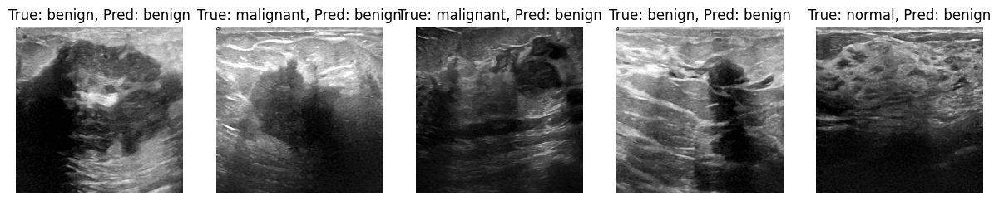

14/14 [==============================] - 12s 868ms/step - loss: 1.8432 - accuracy: 0.3438 - val_loss: 1.7689 - val_accuracy: 0.5625 - lr: 4.0657e-06
Epoch 20/25
1/1 [==============================] - 0s 336ms/steposs: 1.8380 - accuracy: 0.34


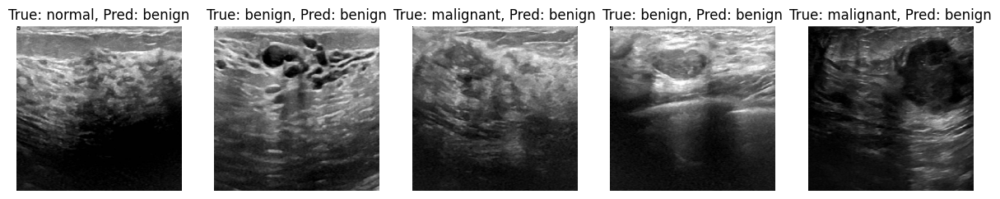

14/14 [==============================] - 13s 925ms/step - loss: 1.8380 - accuracy: 0.3415 - val_loss: 1.7699 - val_accuracy: 0.5625 - lr: 3.6788e-06
Epoch 21/25
1/1 [==============================] - 0s 317ms/steposs: 1.8320 - accuracy: 0.36


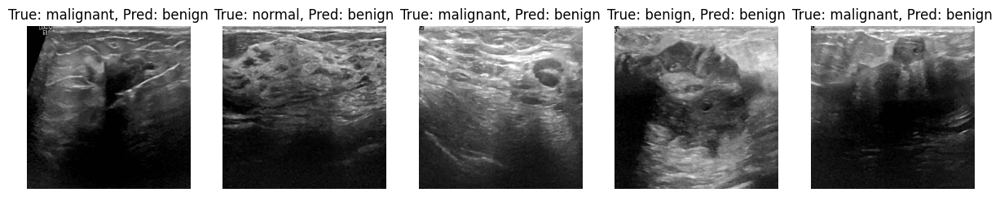

14/14 [==============================] - 13s 956ms/step - loss: 1.8320 - accuracy: 0.3661 - val_loss: 1.7701 - val_accuracy: 0.5625 - lr: 3.3287e-06


In [24]:

history = model.fit(train_gen,
                    epochs=epochs,
                    validation_data=val_gen,
                    class_weight=class_weights_dict,
                    callbacks=[early_stopping, model_checkpoint, reduce_lr_on_plateau, reduce_lr, display_callback])


In [25]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_gen)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

3/3 [==============================] - 2s 459ms/step - loss: 1.7493 - accuracy: 0.5521
Test Loss: 1.749282717704773
Test Accuracy: 0.5520833134651184


### Visualize the Training Process
- Accuracy (How well the model is learning): 
    - overfitting 
        - (Training Accuracy High, Validation Accuracy Low)
    - underfitting
        - (Both Training and Validation Accuracy are low)
-    Loss (How well the model is minimizing error (training loss) and how well it performs on unseen data (validation loss))
        -  A decreasing training loss indicates that the model is learning and improving its preformance
        -  A decreasing validation loss indicates that the model's performance on unseen data is improving. However if the validation loss starts to increase while training loss continues to decrease, it suggests that the model is overfitting the training data


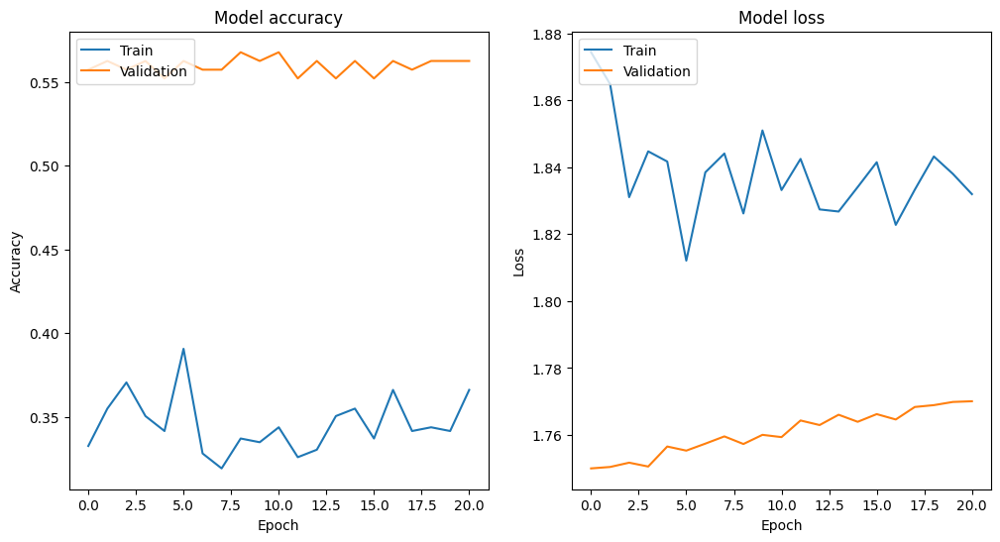

In [26]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

EfficientNetB0 with class weights has a low accuracy for the training data and a higher accuracy for the validation data. Since the training data did not obtain a high accuracy, the accuracy on the test data did not perform much better than the validation data. The addition of the class weights did not help EfficientNetB0's performance. However, we focused our attention on our custom model.

# Building the Model From Scratch

### Custom Model (Sequential)
   -  The Sequential model allows you to build a linear stack of layers ().
- Custom Model Architecture: Defines a CNN with multiple convolutional and pooling layers followed by dense layers.
- Compilation: Sets up the optimizer, loss function, and evaluation metric.
- Callbacks: Implements early stopping, model checkpointing, learning rate reduction, and image display for better training management and monitoring.
- Training: Trains the model with the provided training and validation data, using class weights to address class imbalance.
- Evaluation: Evaluates the model on the test set to obtain performance metrics.
- Visualization: Plots training and validation metrics and displays the confusion matrix to analyze the model's performance.


In [27]:
# Custom model
custom_model = Sequential([
    Conv2D(filter1, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(filter2, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(filter3, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(filter4, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(filter5, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(1024, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(Dropout_Value1),
    Dense(512, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(Dropout_Value2),
    Dense(3, activation='softmax')
])


Epoch 1/25
1/1 [==============================] - 0s 497ms/steposs: 19.4711 - accuracy: 0.39


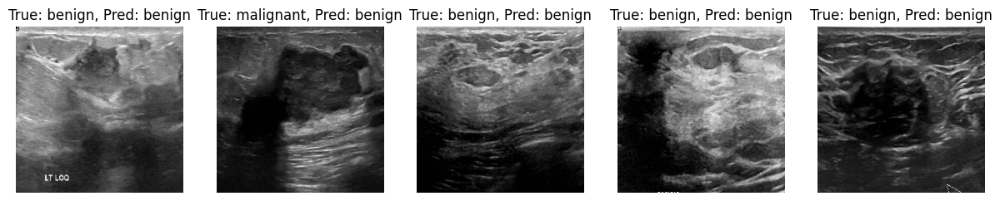

14/14 [==============================] - 21s 1s/step - loss: 19.4711 - accuracy: 0.3973 - val_loss: 12.5569 - val_accuracy: 0.5573 - lr: 5.0000e-04
Epoch 2/25
1/1 [==============================] - 0s 213ms/steposs: 9.1028 - accuracy: 0.47


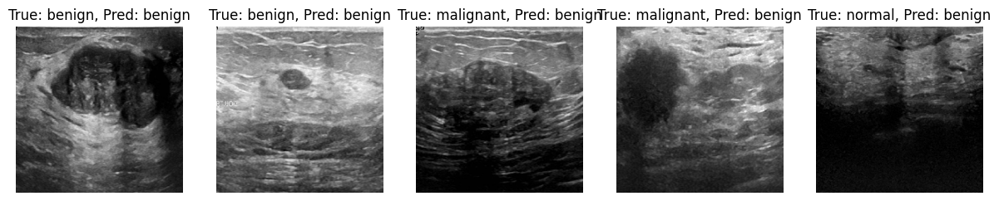

14/14 [==============================] - 13s 936ms/step - loss: 9.1028 - accuracy: 0.4754 - val_loss: 6.1537 - val_accuracy: 0.5573 - lr: 5.0000e-04
Epoch 3/25
1/1 [==============================] - 0s 237ms/steposs: 4.8567 - accuracy: 0.56


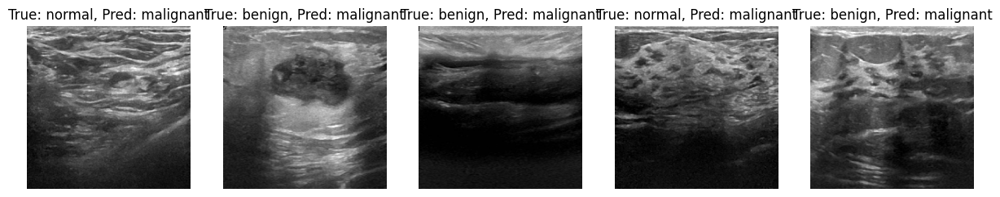

14/14 [==============================] - 13s 927ms/step - loss: 4.8567 - accuracy: 0.5603 - val_loss: 3.7918 - val_accuracy: 0.4844 - lr: 5.0000e-04
Epoch 4/25
1/1 [==============================] - 0s 280ms/steposs: 3.2803 - accuracy: 0.59


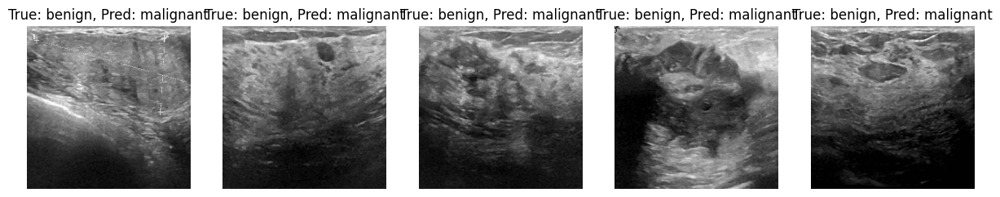

14/14 [==============================] - 15s 1s/step - loss: 3.2803 - accuracy: 0.5960 - val_loss: 2.8364 - val_accuracy: 0.3594 - lr: 5.0000e-04
Epoch 5/25
1/1 [==============================] - 0s 265ms/steposs: 2.5053 - accuracy: 0.61


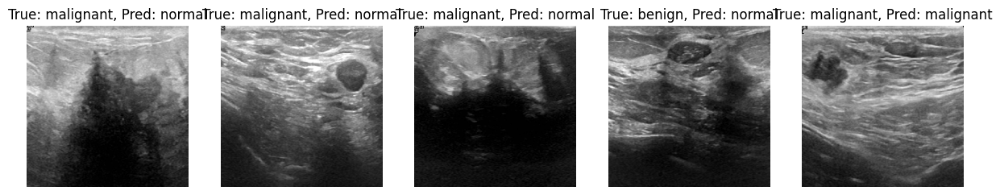

14/14 [==============================] - 22s 2s/step - loss: 2.5053 - accuracy: 0.6116 - val_loss: 2.2686 - val_accuracy: 0.3385 - lr: 5.0000e-04
Epoch 6/25
1/1 [==============================] - 0s 328ms/steposs: 2.0782 - accuracy: 0.54


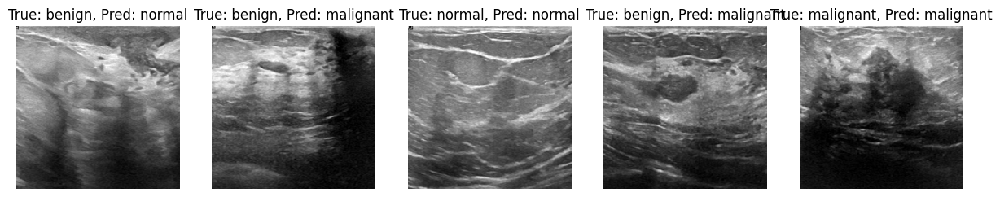

14/14 [==============================] - 20s 1s/step - loss: 2.0782 - accuracy: 0.5402 - val_loss: 1.8721 - val_accuracy: 0.4635 - lr: 5.0000e-04
Epoch 7/25
1/1 [==============================] - 0s 468ms/steposs: 1.6947 - accuracy: 0.61


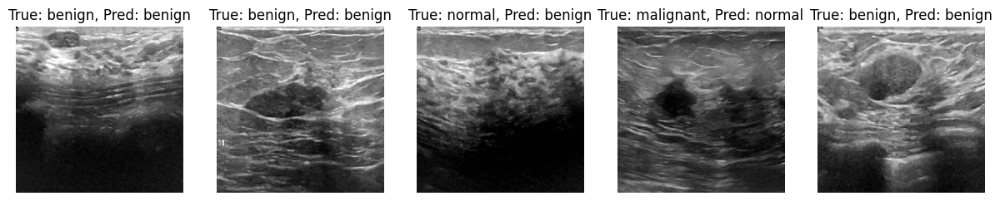

14/14 [==============================] - 22s 2s/step - loss: 1.6947 - accuracy: 0.6183 - val_loss: 1.5916 - val_accuracy: 0.5677 - lr: 5.0000e-04
Epoch 8/25
1/1 [==============================] - 0s 307ms/steposs: 1.4782 - accuracy: 0.59


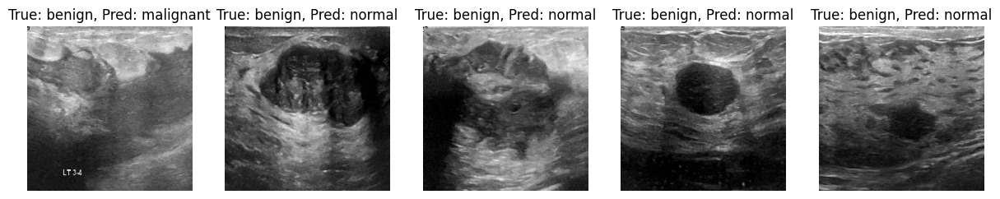

14/14 [==============================] - 19s 1s/step - loss: 1.4782 - accuracy: 0.5915 - val_loss: 1.6232 - val_accuracy: 0.2969 - lr: 5.0000e-04
Epoch 9/25
1/1 [==============================] - 0s 220ms/steposs: 1.3186 - accuracy: 0.62


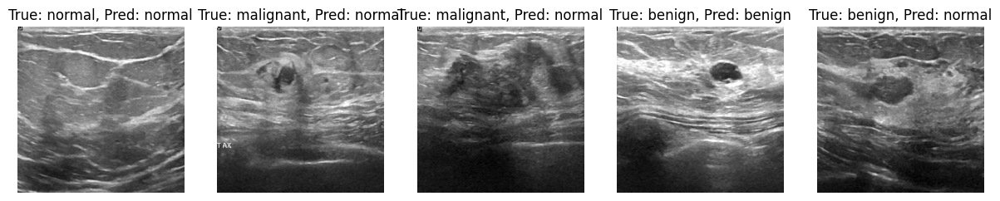

14/14 [==============================] - 17s 1s/step - loss: 1.3186 - accuracy: 0.6228 - val_loss: 1.7850 - val_accuracy: 0.3021 - lr: 5.0000e-04
Epoch 10/25
1/1 [==============================] - 0s 243ms/steposs: 1.2101 - accuracy: 0.64


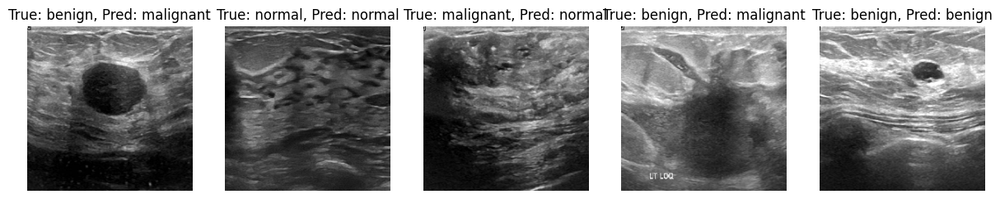

14/14 [==============================] - 13s 944ms/step - loss: 1.2101 - accuracy: 0.6429 - val_loss: 1.6645 - val_accuracy: 0.3438 - lr: 5.0000e-04
Epoch 11/25
1/1 [==============================] - 0s 212ms/steposs: 1.1527 - accuracy: 0.69


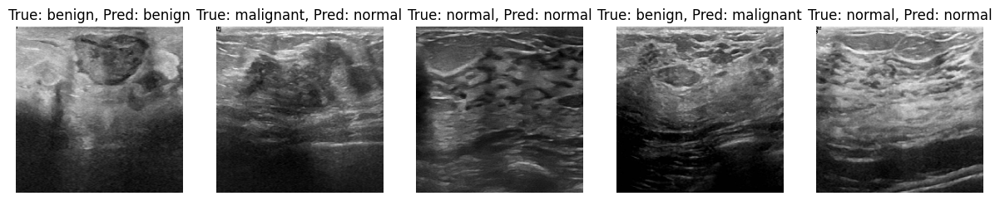

14/14 [==============================] - 14s 976ms/step - loss: 1.1527 - accuracy: 0.6964 - val_loss: 1.4275 - val_accuracy: 0.4740 - lr: 4.5242e-04
Epoch 12/25
1/1 [==============================] - 0s 222ms/steposs: 1.0720 - accuracy: 0.73


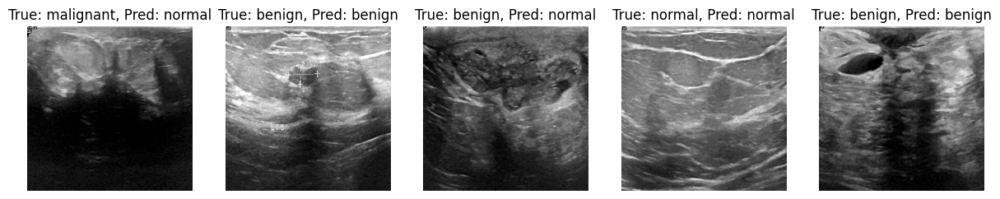

14/14 [==============================] - 14s 1s/step - loss: 1.0720 - accuracy: 0.7321 - val_loss: 1.7738 - val_accuracy: 0.3594 - lr: 4.0937e-04
Epoch 13/25
1/1 [==============================] - 0s 276ms/steposs: 0.9683 - accuracy: 0.75


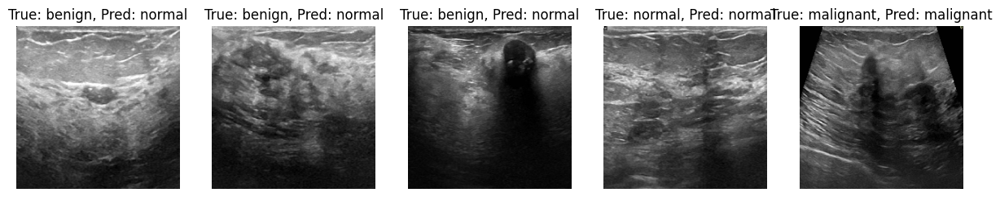

14/14 [==============================] - 14s 1s/step - loss: 0.9683 - accuracy: 0.7545 - val_loss: 1.5152 - val_accuracy: 0.4583 - lr: 3.7041e-04
Epoch 14/25
1/1 [==============================] - 0s 225ms/steposs: 0.8596 - accuracy: 0.77


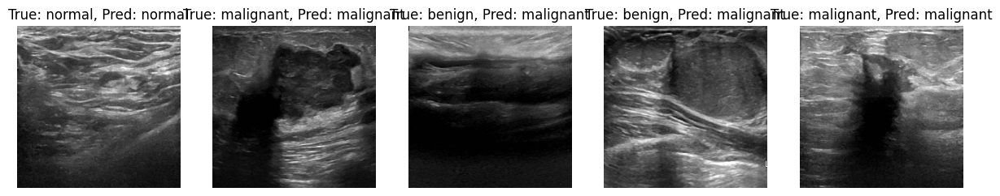

14/14 [==============================] - 19s 1s/step - loss: 0.8596 - accuracy: 0.7746 - val_loss: 1.3363 - val_accuracy: 0.5104 - lr: 3.3516e-04
Epoch 15/25
1/1 [==============================] - 0s 218ms/steposs: 0.7411 - accuracy: 0.83


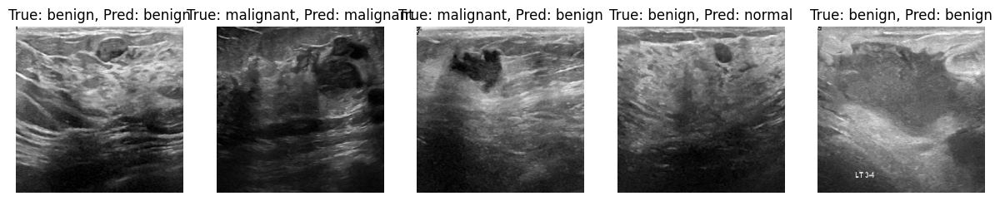

14/14 [==============================] - 16s 1s/step - loss: 0.7411 - accuracy: 0.8393 - val_loss: 1.2334 - val_accuracy: 0.6146 - lr: 3.0327e-04
Epoch 16/25
1/1 [==============================] - 0s 287ms/steposs: 0.7043 - accuracy: 0.86


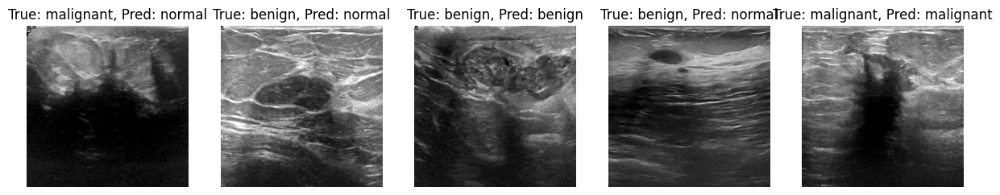

14/14 [==============================] - 17s 1s/step - loss: 0.7043 - accuracy: 0.8616 - val_loss: 1.2527 - val_accuracy: 0.5990 - lr: 2.7441e-04
Epoch 17/25
1/1 [==============================] - 0s 323ms/steposs: 0.6088 - accuracy: 0.87


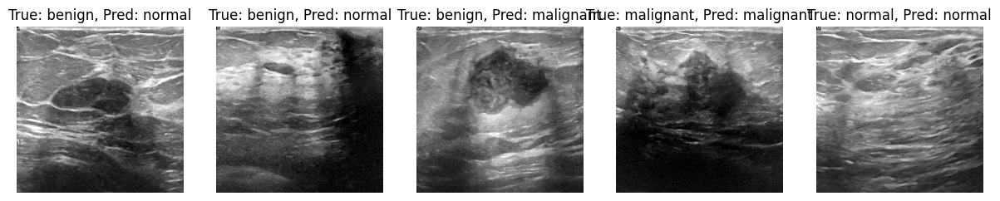

14/14 [==============================] - 19s 1s/step - loss: 0.6088 - accuracy: 0.8728 - val_loss: 1.6907 - val_accuracy: 0.5000 - lr: 2.4829e-04
Epoch 18/25
1/1 [==============================] - 1s 821ms/steposs: 0.5672 - accuracy: 0.91


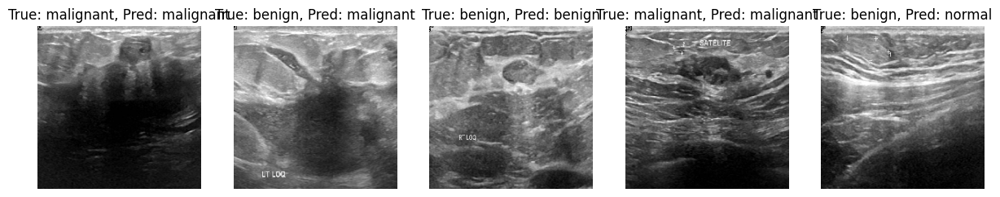

14/14 [==============================] - 20s 1s/step - loss: 0.5672 - accuracy: 0.9196 - val_loss: 1.3418 - val_accuracy: 0.6042 - lr: 2.2466e-04
Epoch 19/25
1/1 [==============================] - 0s 293ms/steposs: 0.5345 - accuracy: 0.90


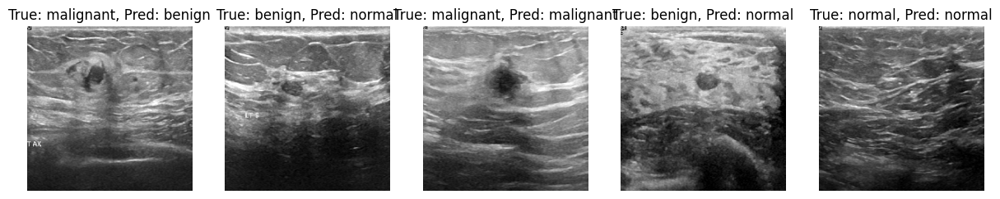

14/14 [==============================] - 18s 1s/step - loss: 0.5345 - accuracy: 0.9018 - val_loss: 1.4584 - val_accuracy: 0.5365 - lr: 2.0328e-04
Epoch 20/25
1/1 [==============================] - 0s 244ms/steposs: 0.4579 - accuracy: 0.93


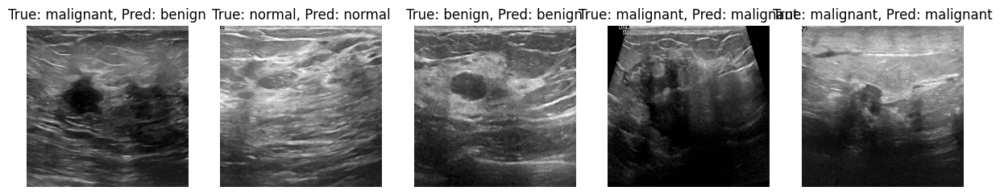

14/14 [==============================] - 15s 1s/step - loss: 0.4579 - accuracy: 0.9330 - val_loss: 1.3601 - val_accuracy: 0.6198 - lr: 1.8394e-04
Epoch 21/25
1/1 [==============================] - 0s 220ms/steposs: 0.4532 - accuracy: 0.94


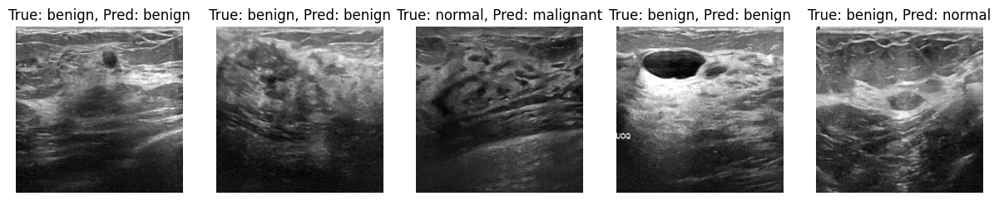

14/14 [==============================] - 14s 999ms/step - loss: 0.4532 - accuracy: 0.9464 - val_loss: 1.1585 - val_accuracy: 0.6667 - lr: 1.6644e-04
Epoch 22/25
1/1 [==============================] - 0s 237ms/steposs: 0.3898 - accuracy: 0.95


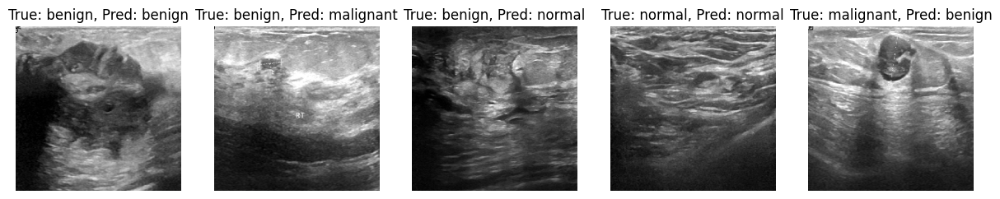

14/14 [==============================] - 13s 951ms/step - loss: 0.3898 - accuracy: 0.9576 - val_loss: 1.4096 - val_accuracy: 0.6198 - lr: 1.5060e-04
Epoch 23/25
1/1 [==============================] - 0s 226ms/steposs: 0.3647 - accuracy: 0.95


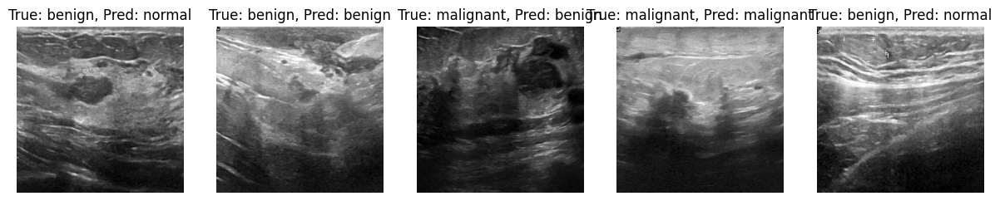

14/14 [==============================] - 14s 978ms/step - loss: 0.3647 - accuracy: 0.9598 - val_loss: 1.3525 - val_accuracy: 0.6667 - lr: 1.3627e-04
Epoch 24/25
1/1 [==============================] - 0s 226ms/steposs: 0.3271 - accuracy: 0.97


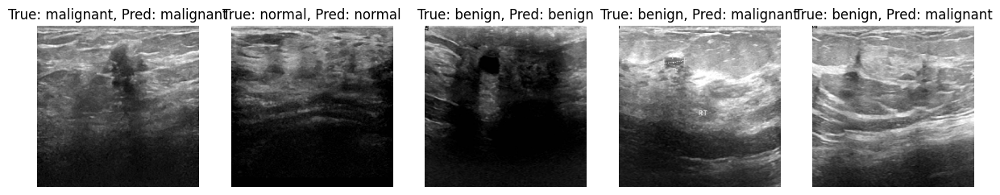

14/14 [==============================] - 13s 940ms/step - loss: 0.3271 - accuracy: 0.9799 - val_loss: 1.4693 - val_accuracy: 0.6302 - lr: 1.2330e-04
Epoch 25/25
1/1 [==============================] - 0s 242ms/steposs: 0.3118 - accuracy: 0.97


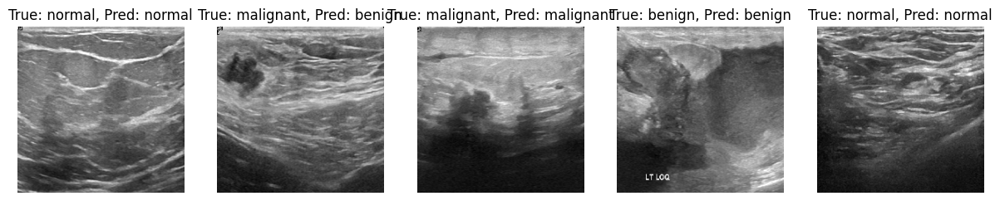

3/3 [==============================] - 3s 862ms/step - loss: 0.9744 - accuracy: 0.7917
Custom Model Test Loss: 0.974402129650116
Custom Model Test Accuracy: 0.7916666865348816


In [28]:
custom_model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the custom model
#custom_history = custom_model.fit(train_gen, epochs=epochs, validation_data=val_gen, callbacks=[early_stopping, model_checkpoint, reduce_lr_on_plateau, reduce_lr])
custom_history  = custom_model.fit(train_gen, epochs=epochs, validation_data=val_gen, class_weight=class_weights_dict,
                    callbacks=[early_stopping, model_checkpoint, reduce_lr_on_plateau, reduce_lr, display_callback])

# Evaluate the custom model on the test set
custom_test_loss, custom_test_accuracy = custom_model.evaluate(test_gen)
print(f"Custom Model Test Loss: {custom_test_loss}")
print(f"Custom Model Test Accuracy: {custom_test_accuracy}")

### Generate Predictions
 - Generating Predictions: The code retrieves a batch of test images, predicts their labels using the custom model, and maps the true and predicted labels to their respective class names.  
- Creating Results DataFrame: A DataFrame is created to compare the true and predicted labels for the test images, making it easier to see where the model's predictions are correct or incorrect.

- This was mainly used to trouble shoot the confusion matrix. 


- Confusion Matrix: The confusion matrix is computed and displayed, providing a visual summary of the model's performance by showing how many test samples were correctly or incorrectly classified for each class.


1/1 [==============================] - 0s 265ms/step
   True Label Predicted Label
0      benign          benign
1   malignant       malignant
2   malignant       malignant
3      benign          normal
4   malignant       malignant
5   malignant       malignant
6      benign          benign
7   malignant          normal
8   malignant       malignant
9      benign          normal
10     benign          benign
11     normal          normal
12     benign          benign
13     benign          benign
14     benign       malignant
15  malignant       malignant
16     benign          benign
17     benign          benign
18     benign          benign
19  malignant       malignant
20     benign       malignant
21     benign          benign
22  malignant       malignant
23     benign          benign
24     normal          normal
25     benign          benign
26     benign          benign
27     normal       malignant
28  malignant       malignant
29     benign          benign
30     benign    

<Figure size 1000x1000 with 0 Axes>

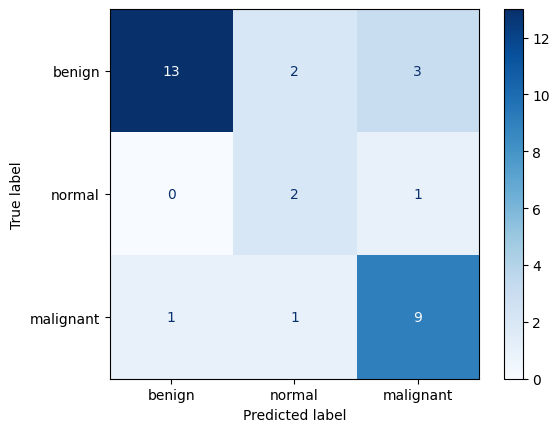

In [29]:
# Generate Predictions
test_images, test_labels = next(iter(test_gen))
predictions = custom_model.predict(test_images)
true_labels = np.argmax(test_labels, axis=1)
pred_labels = np.argmax(predictions, axis=1)
true_class_names = [class_names[label] for label in true_labels]
pred_class_names = [class_names[label] for label in pred_labels]
results_df = pd.DataFrame({'True Label': true_class_names, 'Predicted Label': pred_class_names})
print(results_df)


# Confusion Matrix for the custom model
cm = confusion_matrix(true_labels, pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(10, 10))
disp.plot(cmap=plt.cm.Blues, values_format='g')
plt.show()

This confusion matrix and the resulting dataframe confirm that the model's performance has improved in the sense that it is now predicting for all classes.

### Training and Validation Accuracy / Training and Validation Loss

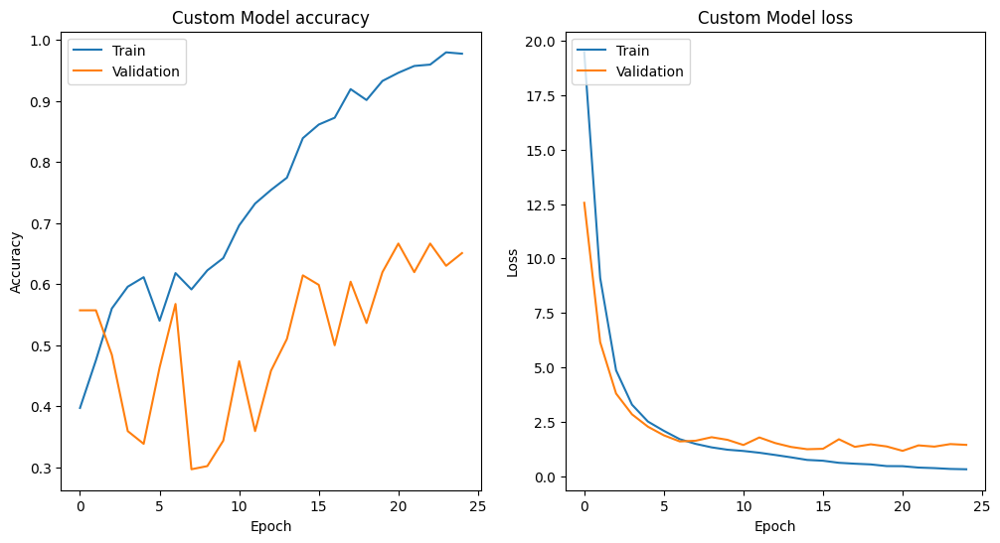

In [30]:
# Plot training & validation accuracy values for custom model
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(custom_history.history['accuracy'])
plt.plot(custom_history.history['val_accuracy'])
plt.title('Custom Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values for custom model
plt.subplot(1, 2, 2)
plt.plot(custom_history.history['loss'])
plt.plot(custom_history.history['val_loss'])
plt.title('Custom Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()



Based on the graphs above the loss model converges to similar values. This indicates that the model is well tuned. The training accuracy steadily increases, indicating that our model is learning the features of our dataset. The validation accuracy is a bit jumpy, but overall appears to start of high, decrease, and then steadily increase before tapering off. It is unclear from this graph alone whether the model is overfitting or has simply plateaued, but it is clear that there is a sizeable gap between the training and validation accuracy.

## Precision Recall Curve
The precision-recall curve is useful for understanding the performance of a model, particularly in the presence of class imbalance.

 - Benign (AP = 0.83):

The model has high performance in identifying benign cases. An AP of 0.83 indicates that the model is good at distinguishing benign cases from others, but there is still room for improvement. Our initial AP score for this class before adding class weights was 0.56.

- Normal (AP = 0.30):

The model struggles with identifying normal cases. An AP of 0.30 is low, indicating that the model often fails to correctly identify normal cases or confuses them with benign or malignant cases. This could be due to a few reasons, such as a low number of normal samples in the training data, poor feature representation, or high similarity between normal and other classes. Our initial AP score for this class before adding class weights was 0.16.

- Malignant (AP = 0.63):

The model has moderate performance in identifying malignant cases. An AP of 0.63 suggests that while the model can sometimes correctly identify malignant cases, it sometimes makes mistakes. Like the normal class, this indicates that the model needs improvement in distinguishing malignant cases from others. Our initial AP score for this class before adding class weights was 0.28.

We believe part of the reason for this output is due to the class imbalance and the relatively small size of our data set.

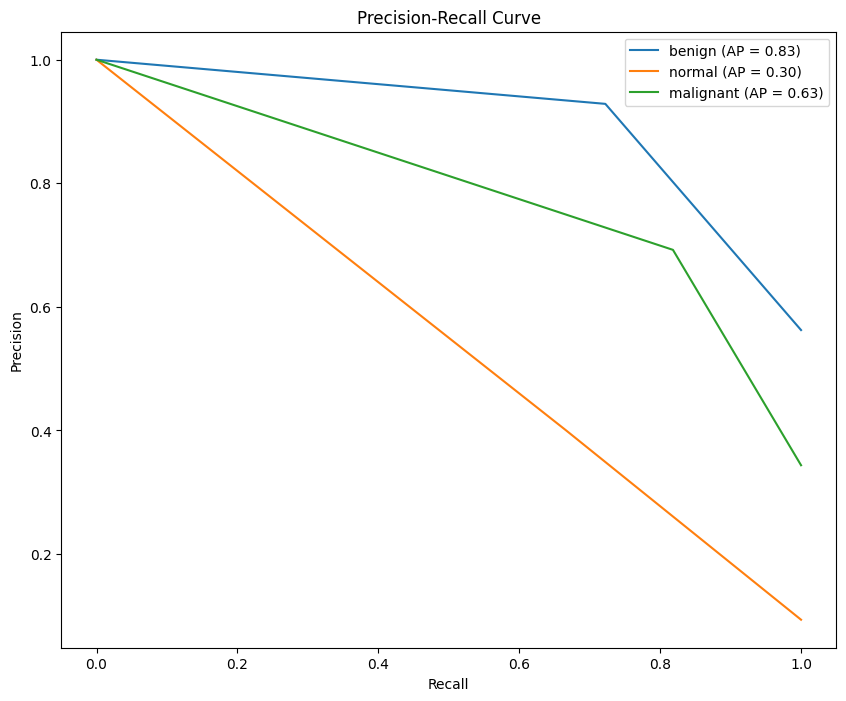

In [32]:
y_true = true_labels  # Set y_true to true_labels from the test set
y_pred = pred_labels  # Set y_pred to pred_labels from the predictions

y_true_bin = tf.keras.utils.to_categorical(y_true, num_classes=len(class_names))
y_pred_bin = tf.keras.utils.to_categorical(y_pred, num_classes=len(class_names))

plt.figure(figsize=(10, 8))

for i in range(len(class_names)):
    precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_bin[:, i])
    avg_precision = average_precision_score(y_true_bin[:, i], y_pred_bin[:, i])
    plt.plot(recall, precision, label=f'{class_names[i]} (AP = {avg_precision:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()




In this project, we employed a multi-layer sequential model to refine the output and obtain better results. We utilized L2 regularization and dropout to reduce the amount of overfitting. Learning rate optimizers and model checkpoints were used to help with validation loss.

Multiple other optimization techniques were used throughout this process, some we kept and some we discarded. One such discarded technique was data augmentation. This avenue initially caused issues and created blank images for the model to train on. We were able to correct that, but ultimately removed it as it did not improve the accuracy of the model.

The biggest issue we encountered was the uneven distribution of the classes in the dataset which required us to utilize class weights as initially the predicted outcomes were doing nothing better than guessing. Despite having a smaller sized dataset, our model performed well against the pre-built EfficientNetB0 model. While our model does not yet meet standards for deployment into the medical sphere for a diagnositc tool, we have shown that deep model learning and convolutional neural networks have considerable potential for being used in such a way. We believe that with more time and more data, this model can be fine tuned even more to generate better results.